## KNN implementation on 220 Band AVIRIS Hyperspectral Image of Indian Pine Test Site 3 
## --> PCA (Raw) with standardization
## --> KNN Library Code
## --> k = best value of k for maximum frequency

# Principal Component Analysis on 220 Band AVIRIS Hyperspectral Image of Indian Pine Test Site 3 
## -> .lan file
## -> with standardization

In [113]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
%matplotlib inline

## Reading .lan file

In [114]:
#import the package
from spectral import *

In [115]:
data = open_image('D:\Academic Thesis Papers\Thesis Report 5\sample-data-master\92AV3C.lan')

In [116]:
data

	Data Source:   'D:\Academic Thesis Papers\Thesis Report 5\sample-data-master\92AV3C.lan'
	# Rows:            145
	# Samples:         145
	# Bands:           220
	Interleave:        BIL
	Quantization:  16 bits
	Data format:     int16

In [117]:
data.shape

(145, 145, 220)

In [118]:
data[:,:,:]

array([[[3172, 4142, 4506, ..., 1020, 1020, 1005],
        [3348, 4266, 4502, ..., 1029, 1020, 1000],
        [3687, 4266, 4421, ..., 1030, 1016, 1009],
        ...,
        [3341, 3890, 4320, ..., 1021, 1015, 1025],
        [3170, 4130, 4320, ..., 1024, 1020, 1011],
        [3172, 3890, 4316, ..., 1034, 1016, 1015]],

       [[3344, 4388, 4334, ..., 1030, 1006, 1015],
        [3515, 4264, 4592, ..., 1039, 1015, 1020],
        [3518, 4268, 4423, ..., 1026, 1015, 1020],
        ...,
        [3859, 4512, 4605, ..., 1035, 1015,  996],
        [3686, 4264, 4690, ..., 1012, 1020, 1014],
        [3512, 4268, 4597, ..., 1019, 1016, 1010]],

       [[3512, 4146, 4416, ..., 1029, 1025, 1010],
        [3344, 4389, 4416, ..., 1021, 1011, 1000],
        [3512, 4273, 4420, ..., 1033, 1010, 1014],
        ...,
        [3341, 4266, 4509, ..., 1025, 1010, 1005],
        [3344, 4262, 4496, ..., 1029, 1020, 1005],
        [3510, 4142, 4230, ..., 1025, 1011, 1010]],

       ...,

       [[3324, 3728, 400

In [119]:
# data[0] won't work here
data[0,:,:]

array([[[3172, 4142, 4506, ..., 1020, 1020, 1005],
        [3348, 4266, 4502, ..., 1029, 1020, 1000],
        [3687, 4266, 4421, ..., 1030, 1016, 1009],
        ...,
        [3341, 3890, 4320, ..., 1021, 1015, 1025],
        [3170, 4130, 4320, ..., 1024, 1020, 1011],
        [3172, 3890, 4316, ..., 1034, 1016, 1015]]], dtype=int16)

In [120]:
data[0,0,:]

array([[[3172, 4142, 4506, 4279, 4782, 5048, 5213, 5106, 5053, 4750,
         4816, 4769, 4610, 4805, 4828, 4861, 4767, 4624, 4549, 4463,
         4462, 4446, 4445, 4336, 4381, 4319, 4207, 4305, 4311, 3991,
         4168, 3942, 4061, 4365, 4318, 4252, 4869, 5284, 5055, 3591,
         5175, 5217, 5058, 4969, 4721, 4291, 4555, 4886, 4868, 4806,
         4783, 4811, 4709, 3903, 3795, 3715, 3359, 2130, 2269, 2480,
         3145, 3626, 4060, 4296, 4211, 4225, 4157, 4133, 4082, 4048,
         3935, 3843, 3784, 3642, 3271, 2707, 1707, 1564, 1838, 1719,
         2229, 2764, 2919, 2873, 2977, 2913, 3034, 3051, 3124, 3101,
         3033, 2713, 2740, 2947, 2706, 2834, 2856, 2683, 2400, 2229,
         1822, 1542, 1097, 1029, 1020, 1026, 1009, 1011, 1047, 1069,
         1100, 1122, 1259, 1365, 1261, 1374, 1630, 1851, 2028, 2130,
         2170, 2205, 2214, 2204, 2100, 2106, 2146, 2089, 2078, 2134,
         2127, 2074, 2057, 2045, 2003, 1999, 1959, 1924, 1883, 1843,
         1781, 1716, 1698, 1645, 1

In [121]:
# (0,0) pixel value of band 0
data[0,0,0]

3172

In [122]:
# (0,0) pixel value of band 1
data[0,0,1]

4142

In [123]:
# (0,0) pixel value of band 219
data[0,0,219]

1005

In [124]:
ground_truth = open_image('D:\Academic Thesis Papers\Thesis Report 5\sample-data-master\92AV3GT.GIS').read_band(0)

In [125]:
ground_truth

array([[3, 3, 3, ..., 0, 0, 0],
       [3, 3, 3, ..., 0, 0, 0],
       [3, 3, 3, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int8)

In [126]:
ground_truth_data = ground_truth
ground_truth_data

array([[3, 3, 3, ..., 0, 0, 0],
       [3, 3, 3, ..., 0, 0, 0],
       [3, 3, 3, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int8)

## Preparing Data by making the band number as features and pixel number as rows

In [127]:
dictionary = dict()
value = list()

for z in range(220):
    count = z + 1
    key = 'band_' + str(count)
    
    for x in range(145):
        for y in range(145):
            value.append(data[x,y,z])
    
    dictionary[key] = value
    value = list()
            
dictionary

{'band_1': [3172,
  3348,
  3687,
  3517,
  3514,
  3343,
  3343,
  3343,
  3346,
  3522,
  3858,
  3514,
  3343,
  3343,
  3343,
  3343,
  3343,
  3343,
  3346,
  3514,
  3341,
  3172,
  3343,
  3341,
  3167,
  3004,
  3514,
  3341,
  3170,
  3170,
  3170,
  3167,
  3002,
  3338,
  2996,
  3004,
  3514,
  3343,
  3346,
  3517,
  3517,
  3514,
  3348,
  3687,
  3514,
  3346,
  3514,
  3343,
  3346,
  3514,
  3343,
  3343,
  3343,
  3348,
  3687,
  3511,
  3172,
  3346,
  3514,
  3346,
  3519,
  3690,
  3690,
  3690,
  3693,
  3858,
  3517,
  3517,
  3511,
  3170,
  3175,
  3514,
  3343,
  3343,
  3341,
  3172,
  3341,
  3167,
  2999,
  3170,
  3162,
  2657,
  3170,
  3167,
  3002,
  3341,
  3172,
  3338,
  2999,
  3170,
  3167,
  2996,
  2999,
  3167,
  3002,
  3341,
  3178,
  3690,
  3687,
  3517,
  3517,
  3514,
  3343,
  3346,
  3511,
  3175,
  3514,
  3343,
  3343,
  3343,
  3341,
  3172,
  3343,
  3346,
  3511,
  3172,
  3341,
  3170,
  3178,
  3685,
  3343,
  3341,
  3175,
  3517

In [128]:
dictionary['band_1']

[3172,
 3348,
 3687,
 3517,
 3514,
 3343,
 3343,
 3343,
 3346,
 3522,
 3858,
 3514,
 3343,
 3343,
 3343,
 3343,
 3343,
 3343,
 3346,
 3514,
 3341,
 3172,
 3343,
 3341,
 3167,
 3004,
 3514,
 3341,
 3170,
 3170,
 3170,
 3167,
 3002,
 3338,
 2996,
 3004,
 3514,
 3343,
 3346,
 3517,
 3517,
 3514,
 3348,
 3687,
 3514,
 3346,
 3514,
 3343,
 3346,
 3514,
 3343,
 3343,
 3343,
 3348,
 3687,
 3511,
 3172,
 3346,
 3514,
 3346,
 3519,
 3690,
 3690,
 3690,
 3693,
 3858,
 3517,
 3517,
 3511,
 3170,
 3175,
 3514,
 3343,
 3343,
 3341,
 3172,
 3341,
 3167,
 2999,
 3170,
 3162,
 2657,
 3170,
 3167,
 3002,
 3341,
 3172,
 3338,
 2999,
 3170,
 3167,
 2996,
 2999,
 3167,
 3002,
 3341,
 3178,
 3690,
 3687,
 3517,
 3517,
 3514,
 3343,
 3346,
 3511,
 3175,
 3514,
 3343,
 3343,
 3343,
 3341,
 3172,
 3343,
 3346,
 3511,
 3172,
 3341,
 3170,
 3178,
 3685,
 3343,
 3341,
 3175,
 3517,
 3517,
 3517,
 3517,
 3519,
 3690,
 3693,
 3858,
 3519,
 3687,
 3522,
 3861,
 3687,
 3517,
 3514,
 3346,
 3514,
 3338,
 3002,
 3341,

In [129]:
np.array(dictionary['band_1'])

array([3172, 3348, 3687, ..., 3153, 3155, 3323], dtype=int16)

In [130]:
np.array(dictionary['band_1']).shape

(21025,)

In [131]:
np.array(dictionary['band_1']).reshape(145,145)

array([[3172, 3348, 3687, ..., 3341, 3170, 3172],
       [3344, 3515, 3518, ..., 3859, 3686, 3512],
       [3512, 3344, 3512, ..., 3341, 3344, 3510],
       ...,
       [3324, 2983, 2988, ..., 3332, 3498, 3156],
       [3161, 3495, 2988, ..., 3156, 3159, 3329],
       [2979, 2977, 2814, ..., 3153, 3155, 3323]], dtype=int16)

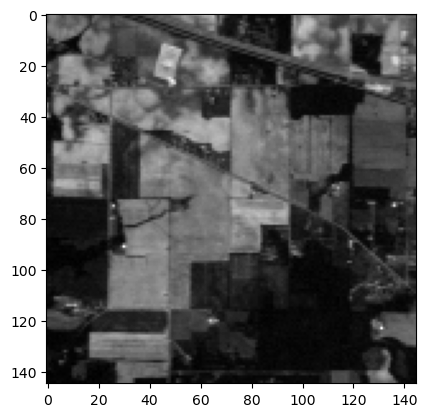

In [132]:
plt.imshow(np.array(dictionary['band_32']).reshape(145,145),cmap='gray')
plt.show()

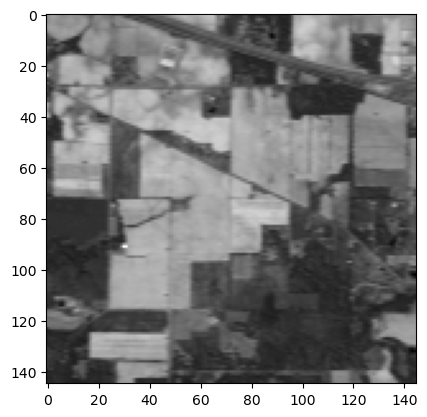

In [133]:
plt.imshow(np.array(dictionary['band_122']).reshape(145,145),cmap='gray')
plt.show()

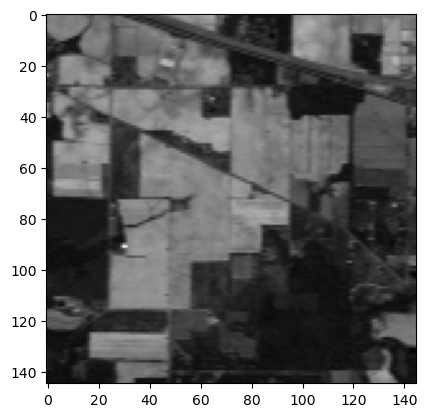

In [134]:
plt.imshow(np.array(dictionary['band_183']).reshape(145,145),cmap='gray')
plt.show()

## Preparing ground truth data as target data

In [135]:
ground_truth_data

array([[3, 3, 3, ..., 0, 0, 0],
       [3, 3, 3, ..., 0, 0, 0],
       [3, 3, 3, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int8)

In [136]:
ground_truth_data.shape

(145, 145)

In [137]:
# number of unique values and their count

diff = dict()

for i in range(145):
    for j in range(145):
        if ground_truth_data[i,j] not in diff:
            diff[ground_truth_data[i,j]] = 1
        else:
            diff[ground_truth_data[i,j]] = diff[ground_truth_data[i,j]] + 1
diff

{3: 834,
 0: 10659,
 15: 380,
 11: 2468,
 12: 614,
 5: 497,
 10: 968,
 14: 1294,
 16: 95,
 2: 1434,
 4: 234,
 8: 489,
 6: 747,
 9: 20,
 1: 54,
 7: 26,
 13: 212}

So there are total 17 classes in this ground truth data

In [138]:
ground_truth_data.reshape(21025,1)

array([[3],
       [3],
       [3],
       ...,
       [0],
       [0],
       [0]], dtype=int8)

In [139]:
target = ground_truth_data.reshape(21025,1)
target

array([[3],
       [3],
       [3],
       ...,
       [0],
       [0],
       [0]], dtype=int8)

In [140]:
print(target.shape)
print(target.ndim)

(21025, 1)
2


but still, 'target' remains as 2D since it's shape is (21025,1). So we need 'target' to be 1D

In [141]:
target = ground_truth_data.reshape(21025,)
target

array([3, 3, 3, ..., 0, 0, 0], dtype=int8)

In [142]:
print(target.shape)
print(target.ndim)

(21025,)
1


# Step by step Principal Component Analysis

## 1. Standardization of Data

In [143]:
original_data = pd.DataFrame(dictionary)

original_data

,band_1,band_2,band_3,band_4,band_5,band_6,band_7,band_8,band_9,band_10,...,band_211,band_212,band_213,band_214,band_215,band_216,band_217,band_218,band_219,band_220
0,3172,4142,4506,4279,4782,5048,5213,5106,5053,4750,...,1094,1090,1112,1090,1062,1069,1057,1020,1020,1005
1,3348,4266,4502,4426,4853,5249,5352,5353,5347,5065,...,1108,1104,1117,1091,1079,1085,1064,1029,1020,1000
2,3687,4266,4421,4498,5019,5293,5438,5427,5383,5132,...,1111,1114,1114,1100,1065,1092,1061,1030,1016,1009
3,3517,4258,4603,4493,4958,5234,5417,5355,5349,5096,...,1122,1108,1109,1109,1071,1088,1060,1030,1006,1005
4,3514,4018,4675,4417,4886,5117,5215,5096,5098,4834,...,1110,1107,1112,1094,1072,1087,1052,1034,1019,1019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21020,3329,3987,4011,4023,4201,4377,4418,4248,4180,3838,...,1013,1012,1018,1015,1011,1001,1000,1009,1008,1009
21021,3494,4104,4024,3880,4210,4377,4413,4174,4229,3900,...,1012,1014,1012,1024,998,1010,1006,1000,1000,1004
21022,3153,3864,4282,3889,4310,4372,4375,4208,4096,3878,...,1016,1015,1016,1021,1008,1019,1003,1008,1000,1009
21023,3155,4104,4109,4027,4139,4318,4413,4174,4140,3933,...,1005,1011,1008,1012,1014,1007,1011,1005,1003,1004


In [144]:
original_data.describe().loc[['mean','std']]

,band_1,band_2,band_3,band_4,band_5,band_6,band_7,band_8,band_9,band_10,...,band_211,band_212,band_213,band_214,band_215,band_216,band_217,band_218,band_219,band_220
mean,3341.313103,4091.957765,4277.523662,4170.075672,4516.685375,4790.607134,4848.334269,4714.739073,4668.916528,4439.259453,...,1061.958240,1060.238383,1063.299215,1050.072913,1040.227539,1043.391011,1030.223496,1015.600856,1008.513864,1006.791011
std,212.254014,227.885060,257.819760,280.381316,346.041777,414.386445,469.244664,491.731609,533.233484,539.486030,...,38.823109,38.694237,41.906116,34.232348,26.447967,29.788944,20.872378,11.437696,7.052013,6.995153


In [145]:
# just counting if any mean or std of any band or feature is 0

count = 0
for i in original_data.describe().loc[['mean','std']].loc['mean']:
    if i ==0 :
        count = count + 1
print(count)

count = 0
for i in original_data.describe().loc[['mean','std']].loc['std']:
    if i ==0 :
        count = count + 1
print(count)

0
0


In [146]:
# standardizing the data

l = list()
data = dict()
count = 0

for i in original_data.columns:
    mean = original_data[i].mean()
    std = original_data[i].std()

    for x in original_data[i]:
        z = (x - mean) / std
        l.append(z)

    data[i] = l
    l = list()

data

{'band_1': [-0.7976909360513352,
  0.031504217104217545,
  1.6286471541481515,
  0.8277200175774472,
  0.813586009285023,
  0.007947536616843888,
  0.007947536616843888,
  0.007947536616843888,
  0.022081544909268083,
  0.8512766980648209,
  2.4342856268163304,
  0.813586009285023,
  0.007947536616843888,
  0.007947536616843888,
  0.007947536616843888,
  0.007947536616843888,
  0.007947536616843888,
  0.007947536616843888,
  0.022081544909268083,
  0.813586009285023,
  -0.001475135578105574,
  -0.7976909360513352,
  0.007947536616843888,
  -0.001475135578105574,
  -0.8212476165387088,
  -1.58919540042709,
  0.813586009285023,
  -0.001475135578105574,
  -0.8071136082462846,
  -0.8071136082462846,
  -0.8071136082462846,
  -0.8212476165387088,
  -1.5986180726220396,
  -0.015609143870529769,
  -1.626886089206888,
  -1.58919540042709,
  0.813586009285023,
  0.007947536616843888,
  0.022081544909268083,
  0.8277200175774472,
  0.8277200175774472,
  0.813586009285023,
  0.031504217104217545,


In [147]:
standardized_data = pd.DataFrame(data)

standardized_data

,band_1,band_2,band_3,band_4,band_5,band_6,band_7,band_8,band_9,band_10,...,band_211,band_212,band_213,band_214,band_215,band_216,band_217,band_218,band_219,band_220
0,-0.797691,0.219594,0.886186,0.388486,0.766713,0.621142,0.777133,0.795680,0.720291,0.575994,...,0.825327,0.769149,1.162140,1.166355,0.823219,0.859681,1.282868,0.384618,1.628774,-0.256036
1,0.031504,0.763728,0.870672,0.912772,0.971890,1.106197,1.073354,1.297986,1.271645,1.159883,...,1.185937,1.130960,1.281455,1.195568,1.465990,1.396793,1.618239,1.171490,1.628774,-0.970817
2,1.628647,0.763728,0.556499,1.169566,1.451601,1.212378,1.256627,1.448475,1.339157,1.284075,...,1.263211,1.389396,1.209866,1.458477,0.936649,1.631780,1.474509,1.258920,1.061560,0.315789
3,0.827720,0.728623,1.262418,1.151733,1.275322,1.069998,1.211875,1.302054,1.275395,1.217345,...,1.546547,1.234334,1.090552,1.721386,1.163510,1.497502,1.426599,1.258920,-0.356475,-0.256036
4,0.813586,-0.324540,1.541683,0.880673,1.067254,0.787653,0.781396,0.775344,0.804682,0.731697,...,1.237453,1.208490,1.162140,1.283204,1.201320,1.463932,1.043317,1.608641,1.486971,1.745350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21020,-0.058011,-0.460573,-1.033760,-0.524556,-0.912275,-0.998119,-0.917079,-0.949174,-0.916890,-1.114504,...,-1.261059,-1.246655,-1.080969,-1.024555,-1.105096,-1.423045,-1.448014,-0.577114,-0.072868,0.315789
21021,0.719359,0.052843,-0.983337,-1.034576,-0.886267,-0.998119,-0.927734,-1.099663,-0.824998,-0.999580,...,-1.286817,-1.194968,-1.224146,-0.761645,-1.596627,-1.120920,-1.160553,-1.363986,-1.207296,-0.398992
21022,-0.887206,-1.000319,0.017362,-1.002476,-0.597284,-1.010185,-1.008715,-1.030520,-1.074420,-1.040360,...,-1.183786,-1.169125,-1.128695,-0.849282,-1.218526,-0.818794,-1.304283,-0.664544,-1.207296,0.315789
21023,-0.877784,0.052843,-0.653649,-0.510290,-1.091444,-1.140499,-0.927734,-1.099663,-0.991904,-0.938411,...,-1.467122,-1.272499,-1.319598,-1.112191,-0.991666,-1.221628,-0.921002,-0.926835,-0.781885,-0.398992


In [148]:
standardized_data.describe().loc[['mean','std']]

,band_1,band_2,band_3,band_4,band_5,band_6,band_7,band_8,band_9,band_10,...,band_211,band_212,band_213,band_214,band_215,band_216,band_217,band_218,band_219,band_220
mean,2.134513e-15,-1.177106e-15,-2.770647e-16,3.398867e-15,2.276620e-15,-1.466603e-16,-1.075889e-15,-5.391433e-16,2.952892e-15,1.698448e-15,...,4.402038e-15,5.970217e-15,-2.867306e-15,-2.059930e-15,-1.243491e-14,-3.502792e-15,-2.780590e-15,1.358649e-14,-3.746106e-15,-1.666066e-14
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,...,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


## 2. Calculate the covariance matrix

In [149]:
standardized_data.cov()

,band_1,band_2,band_3,band_4,band_5,band_6,band_7,band_8,band_9,band_10,...,band_211,band_212,band_213,band_214,band_215,band_216,band_217,band_218,band_219,band_220
band_1,1.000000,0.563007,0.616994,0.620595,0.615682,0.611655,0.609102,0.605655,0.603436,0.600867,...,0.517841,0.514609,0.516099,0.515108,0.509410,0.509969,0.503952,0.453681,0.322432,0.299360
band_2,0.563007,1.000000,0.808276,0.835069,0.840429,0.842243,0.840364,0.837355,0.833722,0.831761,...,0.723079,0.721210,0.721686,0.720781,0.711550,0.717072,0.705758,0.639324,0.429307,0.403894
band_3,0.616994,0.808276,1.000000,0.906614,0.925878,0.926097,0.926234,0.924474,0.922530,0.920396,...,0.808938,0.805500,0.808180,0.806054,0.794344,0.800333,0.786778,0.710247,0.470423,0.435978
band_4,0.620595,0.835069,0.906614,1.000000,0.952082,0.958557,0.957809,0.957076,0.955979,0.954552,...,0.845164,0.841631,0.843962,0.841896,0.829997,0.835018,0.821721,0.736465,0.482669,0.449289
band_5,0.615682,0.840429,0.925878,0.952082,1.000000,0.979336,0.982393,0.981323,0.980954,0.980028,...,0.873577,0.870644,0.872415,0.869913,0.858037,0.863499,0.848516,0.760494,0.489920,0.458720
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
band_216,0.509969,0.717072,0.800333,0.835018,0.863499,0.873311,0.882925,0.888376,0.893984,0.897734,...,0.973470,0.972493,0.974358,0.970408,0.963105,1.000000,0.949725,0.853353,0.546162,0.514915
band_217,0.503952,0.705758,0.786778,0.821721,0.848516,0.857262,0.867474,0.871886,0.877703,0.881129,...,0.955560,0.954422,0.956276,0.952209,0.946096,0.949725,1.000000,0.841246,0.539986,0.508591
band_218,0.453681,0.639324,0.710247,0.736465,0.760494,0.767388,0.776360,0.780644,0.785221,0.788020,...,0.855985,0.854884,0.857495,0.855039,0.849490,0.853353,0.841246,1.000000,0.500253,0.472133
band_219,0.322432,0.429307,0.470423,0.482669,0.489920,0.493155,0.496874,0.498875,0.501732,0.502060,...,0.546717,0.546705,0.547075,0.545649,0.542928,0.546162,0.539986,0.500253,1.000000,0.329172


## 3. Calculate eigenvalues and eigenvectors

In [150]:
from numpy.linalg import eig

In [151]:
a = standardized_data.cov()
a

,band_1,band_2,band_3,band_4,band_5,band_6,band_7,band_8,band_9,band_10,...,band_211,band_212,band_213,band_214,band_215,band_216,band_217,band_218,band_219,band_220
band_1,1.000000,0.563007,0.616994,0.620595,0.615682,0.611655,0.609102,0.605655,0.603436,0.600867,...,0.517841,0.514609,0.516099,0.515108,0.509410,0.509969,0.503952,0.453681,0.322432,0.299360
band_2,0.563007,1.000000,0.808276,0.835069,0.840429,0.842243,0.840364,0.837355,0.833722,0.831761,...,0.723079,0.721210,0.721686,0.720781,0.711550,0.717072,0.705758,0.639324,0.429307,0.403894
band_3,0.616994,0.808276,1.000000,0.906614,0.925878,0.926097,0.926234,0.924474,0.922530,0.920396,...,0.808938,0.805500,0.808180,0.806054,0.794344,0.800333,0.786778,0.710247,0.470423,0.435978
band_4,0.620595,0.835069,0.906614,1.000000,0.952082,0.958557,0.957809,0.957076,0.955979,0.954552,...,0.845164,0.841631,0.843962,0.841896,0.829997,0.835018,0.821721,0.736465,0.482669,0.449289
band_5,0.615682,0.840429,0.925878,0.952082,1.000000,0.979336,0.982393,0.981323,0.980954,0.980028,...,0.873577,0.870644,0.872415,0.869913,0.858037,0.863499,0.848516,0.760494,0.489920,0.458720
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
band_216,0.509969,0.717072,0.800333,0.835018,0.863499,0.873311,0.882925,0.888376,0.893984,0.897734,...,0.973470,0.972493,0.974358,0.970408,0.963105,1.000000,0.949725,0.853353,0.546162,0.514915
band_217,0.503952,0.705758,0.786778,0.821721,0.848516,0.857262,0.867474,0.871886,0.877703,0.881129,...,0.955560,0.954422,0.956276,0.952209,0.946096,0.949725,1.000000,0.841246,0.539986,0.508591
band_218,0.453681,0.639324,0.710247,0.736465,0.760494,0.767388,0.776360,0.780644,0.785221,0.788020,...,0.855985,0.854884,0.857495,0.855039,0.849490,0.853353,0.841246,1.000000,0.500253,0.472133
band_219,0.322432,0.429307,0.470423,0.482669,0.489920,0.493155,0.496874,0.498875,0.501732,0.502060,...,0.546717,0.546705,0.547075,0.545649,0.542928,0.546162,0.539986,0.500253,1.000000,0.329172


In [152]:
w,v=eig(a)
print('eigenvalues :\n', w)
print()
print('eigenvectors :\n', v)

eigenvalues :
 [1.41823678e+02 4.69445812e+01 4.50331761e+00 1.83587295e+00
 1.60533632e+00 1.31920493e+00 1.09573604e+00 1.03546462e+00
 9.90900086e-01 9.54730101e-01 9.48733585e-01 9.34664589e-01
 9.40152724e-01 9.38126364e-01 9.15399564e-01 9.05063503e-01
 9.02083492e-01 8.68058516e-01 8.71459416e-01 8.34745492e-01
 8.27961304e-01 7.86147691e-01 7.72934650e-01 6.94725828e-01
 6.69884666e-01 6.17800524e-01 5.36354203e-01 3.88575506e-01
 3.50779827e-01 2.87826787e-01 3.04370746e-01 2.98985847e-01
 2.49711423e-01 1.80801004e-01 1.57631607e-01 1.39630503e-01
 1.17795790e-01 1.10779902e-01 8.51292071e-02 8.19943461e-02
 6.34907153e-02 5.66726105e-02 5.36023836e-02 5.14683211e-02
 4.92854737e-02 4.10688636e-02 3.92485231e-02 3.66699549e-02
 3.57822014e-02 3.34458188e-02 3.06373076e-02 2.74025273e-02
 2.48924780e-02 2.44975555e-02 2.27601690e-02 2.04311166e-02
 1.91925260e-02 1.74844888e-02 1.69774809e-02 1.57813261e-02
 1.49727328e-02 1.41987521e-02 1.31619005e-02 1.28551499e-02
 1.179666

## 4. Sort the eigenvector in descending order based on eigenvalues and form feature vector

In [153]:
a

,band_1,band_2,band_3,band_4,band_5,band_6,band_7,band_8,band_9,band_10,...,band_211,band_212,band_213,band_214,band_215,band_216,band_217,band_218,band_219,band_220
band_1,1.000000,0.563007,0.616994,0.620595,0.615682,0.611655,0.609102,0.605655,0.603436,0.600867,...,0.517841,0.514609,0.516099,0.515108,0.509410,0.509969,0.503952,0.453681,0.322432,0.299360
band_2,0.563007,1.000000,0.808276,0.835069,0.840429,0.842243,0.840364,0.837355,0.833722,0.831761,...,0.723079,0.721210,0.721686,0.720781,0.711550,0.717072,0.705758,0.639324,0.429307,0.403894
band_3,0.616994,0.808276,1.000000,0.906614,0.925878,0.926097,0.926234,0.924474,0.922530,0.920396,...,0.808938,0.805500,0.808180,0.806054,0.794344,0.800333,0.786778,0.710247,0.470423,0.435978
band_4,0.620595,0.835069,0.906614,1.000000,0.952082,0.958557,0.957809,0.957076,0.955979,0.954552,...,0.845164,0.841631,0.843962,0.841896,0.829997,0.835018,0.821721,0.736465,0.482669,0.449289
band_5,0.615682,0.840429,0.925878,0.952082,1.000000,0.979336,0.982393,0.981323,0.980954,0.980028,...,0.873577,0.870644,0.872415,0.869913,0.858037,0.863499,0.848516,0.760494,0.489920,0.458720
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
band_216,0.509969,0.717072,0.800333,0.835018,0.863499,0.873311,0.882925,0.888376,0.893984,0.897734,...,0.973470,0.972493,0.974358,0.970408,0.963105,1.000000,0.949725,0.853353,0.546162,0.514915
band_217,0.503952,0.705758,0.786778,0.821721,0.848516,0.857262,0.867474,0.871886,0.877703,0.881129,...,0.955560,0.954422,0.956276,0.952209,0.946096,0.949725,1.000000,0.841246,0.539986,0.508591
band_218,0.453681,0.639324,0.710247,0.736465,0.760494,0.767388,0.776360,0.780644,0.785221,0.788020,...,0.855985,0.854884,0.857495,0.855039,0.849490,0.853353,0.841246,1.000000,0.500253,0.472133
band_219,0.322432,0.429307,0.470423,0.482669,0.489920,0.493155,0.496874,0.498875,0.501732,0.502060,...,0.546717,0.546705,0.547075,0.545649,0.542928,0.546162,0.539986,0.500253,1.000000,0.329172


In [154]:
a.shape 

(220, 220)

In [155]:
eigen_number = a.shape[0]
eigen_number

220

In [156]:
# grabbing the eigenectors from 'v'

l = list()

for i in range(eigen_number):
    s = v[:,i]
    s2 = s.reshape(eigen_number,1)
    l.append(s2)

l

[array([[ 0.04498693],
        [ 0.06280146],
        [ 0.07014177],
        [ 0.07329483],
        [ 0.07581937],
        [ 0.07665425],
        [ 0.0774737 ],
        [ 0.07788721],
        [ 0.07844229],
        [ 0.07871897],
        [ 0.07905823],
        [ 0.07919373],
        [ 0.07898542],
        [ 0.07824676],
        [ 0.07789891],
        [ 0.07786995],
        [ 0.07810887],
        [ 0.07897726],
        [ 0.07972486],
        [ 0.08011723],
        [ 0.08041455],
        [ 0.08065318],
        [ 0.08091713],
        [ 0.08110204],
        [ 0.08128836],
        [ 0.08148211],
        [ 0.0816403 ],
        [ 0.08176938],
        [ 0.08186393],
        [ 0.08191335],
        [ 0.08143731],
        [ 0.08171213],
        [ 0.08122941],
        [ 0.07833665],
        [ 0.06872276],
        [ 0.02995687],
        [-0.02433468],
        [-0.04740237],
        [-0.05390779],
        [-0.05651423],
        [-0.05701335],
        [-0.05724169],
        [-0.05698788],
        [-0

In [157]:
l[0]

array([[ 0.04498693],
       [ 0.06280146],
       [ 0.07014177],
       [ 0.07329483],
       [ 0.07581937],
       [ 0.07665425],
       [ 0.0774737 ],
       [ 0.07788721],
       [ 0.07844229],
       [ 0.07871897],
       [ 0.07905823],
       [ 0.07919373],
       [ 0.07898542],
       [ 0.07824676],
       [ 0.07789891],
       [ 0.07786995],
       [ 0.07810887],
       [ 0.07897726],
       [ 0.07972486],
       [ 0.08011723],
       [ 0.08041455],
       [ 0.08065318],
       [ 0.08091713],
       [ 0.08110204],
       [ 0.08128836],
       [ 0.08148211],
       [ 0.0816403 ],
       [ 0.08176938],
       [ 0.08186393],
       [ 0.08191335],
       [ 0.08143731],
       [ 0.08171213],
       [ 0.08122941],
       [ 0.07833665],
       [ 0.06872276],
       [ 0.02995687],
       [-0.02433468],
       [-0.04740237],
       [-0.05390779],
       [-0.05651423],
       [-0.05701335],
       [-0.05724169],
       [-0.05698788],
       [-0.05710852],
       [-0.05682854],
       [-0

In [158]:
len(l)

220

In [159]:
# sorting eigenvector based on eigenvalue

for i in range(len(w)):
    for j in range(i+1,len(w)):
        if w[j] > w[i] :
            temp = w[i]
            w[i] = w[j]
            w[j] = temp

            temp2 = l[i]
            l[i] = l[j]
            l[j] = temp2

print(w)
print(l)

[1.41823678e+02 4.69445812e+01 4.50331761e+00 1.83587295e+00
 1.60533632e+00 1.31920493e+00 1.09573604e+00 1.03546462e+00
 9.90900086e-01 9.54730101e-01 9.48733585e-01 9.40152724e-01
 9.38126364e-01 9.34664589e-01 9.15399564e-01 9.05063503e-01
 9.02083492e-01 8.71459416e-01 8.68058516e-01 8.34745492e-01
 8.27961304e-01 7.86147691e-01 7.72934650e-01 6.94725828e-01
 6.69884666e-01 6.17800524e-01 5.36354203e-01 3.88575506e-01
 3.50779827e-01 3.04370746e-01 2.98985847e-01 2.87826787e-01
 2.49711423e-01 1.80801004e-01 1.57631607e-01 1.39630503e-01
 1.17795790e-01 1.10779902e-01 8.51292071e-02 8.19943461e-02
 6.34907153e-02 5.66726105e-02 5.36023836e-02 5.14683211e-02
 4.92854737e-02 4.10688636e-02 3.92485231e-02 3.66699549e-02
 3.57822014e-02 3.34458188e-02 3.06373076e-02 2.74025273e-02
 2.48924780e-02 2.44975555e-02 2.27601690e-02 2.04311166e-02
 1.91925260e-02 1.74844888e-02 1.69774809e-02 1.57813261e-02
 1.49727328e-02 1.41987521e-02 1.31619005e-02 1.28551499e-02
 1.19101518e-02 1.179666

In [160]:
np.hstack(l)

array([[ 4.49869265e-02,  1.10314349e-02, -1.43264192e-01, ...,
         2.27240794e-04, -6.07610544e-04, -1.67065279e-04],
       [ 6.28014601e-02,  4.17896918e-03, -1.78017421e-01, ...,
         1.09153308e-04, -2.51956038e-04,  2.46558595e-04],
       [ 7.01417728e-02,  5.97839646e-03, -1.78911594e-01, ...,
        -1.30690204e-04, -4.67288583e-04,  1.27335165e-04],
       ...,
       [ 7.11617039e-02,  4.52034489e-03, -1.28667584e-02, ...,
        -2.73295665e-04,  1.33578780e-04, -9.34463505e-06],
       [ 4.55049605e-02,  6.30249927e-04, -1.21076051e-02, ...,
        -7.20089342e-05, -6.88700825e-06,  5.45045641e-05],
       [ 4.25143011e-02,  5.78599871e-03, -1.73272938e-02, ...,
        -1.66944680e-05,  3.04671759e-05, -1.35718264e-04]])

In [161]:
# forming feature vector

V = np.hstack(l)
V

array([[ 4.49869265e-02,  1.10314349e-02, -1.43264192e-01, ...,
         2.27240794e-04, -6.07610544e-04, -1.67065279e-04],
       [ 6.28014601e-02,  4.17896918e-03, -1.78017421e-01, ...,
         1.09153308e-04, -2.51956038e-04,  2.46558595e-04],
       [ 7.01417728e-02,  5.97839646e-03, -1.78911594e-01, ...,
        -1.30690204e-04, -4.67288583e-04,  1.27335165e-04],
       ...,
       [ 7.11617039e-02,  4.52034489e-03, -1.28667584e-02, ...,
        -2.73295665e-04,  1.33578780e-04, -9.34463505e-06],
       [ 4.55049605e-02,  6.30249927e-04, -1.21076051e-02, ...,
        -7.20089342e-05, -6.88700825e-06,  5.45045641e-05],
       [ 4.25143011e-02,  5.78599871e-03, -1.73272938e-02, ...,
        -1.66944680e-05,  3.04671759e-05, -1.35718264e-04]])

In [162]:
V.shape

(220, 220)

## 5. Calculate the principal components

In [163]:
D = standardized_data
D

,band_1,band_2,band_3,band_4,band_5,band_6,band_7,band_8,band_9,band_10,...,band_211,band_212,band_213,band_214,band_215,band_216,band_217,band_218,band_219,band_220
0,-0.797691,0.219594,0.886186,0.388486,0.766713,0.621142,0.777133,0.795680,0.720291,0.575994,...,0.825327,0.769149,1.162140,1.166355,0.823219,0.859681,1.282868,0.384618,1.628774,-0.256036
1,0.031504,0.763728,0.870672,0.912772,0.971890,1.106197,1.073354,1.297986,1.271645,1.159883,...,1.185937,1.130960,1.281455,1.195568,1.465990,1.396793,1.618239,1.171490,1.628774,-0.970817
2,1.628647,0.763728,0.556499,1.169566,1.451601,1.212378,1.256627,1.448475,1.339157,1.284075,...,1.263211,1.389396,1.209866,1.458477,0.936649,1.631780,1.474509,1.258920,1.061560,0.315789
3,0.827720,0.728623,1.262418,1.151733,1.275322,1.069998,1.211875,1.302054,1.275395,1.217345,...,1.546547,1.234334,1.090552,1.721386,1.163510,1.497502,1.426599,1.258920,-0.356475,-0.256036
4,0.813586,-0.324540,1.541683,0.880673,1.067254,0.787653,0.781396,0.775344,0.804682,0.731697,...,1.237453,1.208490,1.162140,1.283204,1.201320,1.463932,1.043317,1.608641,1.486971,1.745350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21020,-0.058011,-0.460573,-1.033760,-0.524556,-0.912275,-0.998119,-0.917079,-0.949174,-0.916890,-1.114504,...,-1.261059,-1.246655,-1.080969,-1.024555,-1.105096,-1.423045,-1.448014,-0.577114,-0.072868,0.315789
21021,0.719359,0.052843,-0.983337,-1.034576,-0.886267,-0.998119,-0.927734,-1.099663,-0.824998,-0.999580,...,-1.286817,-1.194968,-1.224146,-0.761645,-1.596627,-1.120920,-1.160553,-1.363986,-1.207296,-0.398992
21022,-0.887206,-1.000319,0.017362,-1.002476,-0.597284,-1.010185,-1.008715,-1.030520,-1.074420,-1.040360,...,-1.183786,-1.169125,-1.128695,-0.849282,-1.218526,-0.818794,-1.304283,-0.664544,-1.207296,0.315789
21023,-0.877784,0.052843,-0.653649,-0.510290,-1.091444,-1.140499,-0.927734,-1.099663,-0.991904,-0.938411,...,-1.467122,-1.272499,-1.319598,-1.112191,-0.991666,-1.221628,-0.921002,-0.926835,-0.781885,-0.398992


In [164]:
V

array([[ 4.49869265e-02,  1.10314349e-02, -1.43264192e-01, ...,
         2.27240794e-04, -6.07610544e-04, -1.67065279e-04],
       [ 6.28014601e-02,  4.17896918e-03, -1.78017421e-01, ...,
         1.09153308e-04, -2.51956038e-04,  2.46558595e-04],
       [ 7.01417728e-02,  5.97839646e-03, -1.78911594e-01, ...,
        -1.30690204e-04, -4.67288583e-04,  1.27335165e-04],
       ...,
       [ 7.11617039e-02,  4.52034489e-03, -1.28667584e-02, ...,
        -2.73295665e-04,  1.33578780e-04, -9.34463505e-06],
       [ 4.55049605e-02,  6.30249927e-04, -1.21076051e-02, ...,
        -7.20089342e-05, -6.88700825e-06,  5.45045641e-05],
       [ 4.25143011e-02,  5.78599871e-03, -1.73272938e-02, ...,
        -1.66944680e-05,  3.04671759e-05, -1.35718264e-04]])

In [165]:
transformed_table = np.dot(D,V)
transformed_table

array([[ 1.03246641e+01, -5.45202499e+00,  6.07662220e-02, ...,
         6.91427796e-03, -4.28351420e-03, -5.77209554e-03],
       [ 1.30864775e+01,  1.26150800e+00, -1.62535550e+00, ...,
        -8.23742981e-03,  7.65479898e-03, -9.75896944e-03],
       [ 1.42965589e+01,  3.32027852e+00, -2.23940385e+00, ...,
         1.97702462e-03,  8.45398365e-03, -1.27451168e-02],
       ...,
       [-1.55132168e+01,  3.70842210e+00, -6.48144365e-01, ...,
         2.68091397e-02, -3.29588424e-04, -8.91272787e-03],
       [-1.57046174e+01, -1.41180721e+00, -1.15583170e+00, ...,
         2.70092547e-03,  6.89313911e-03,  7.35038274e-03],
       [-1.57631925e+01, -2.73989178e-01, -1.09873003e+00, ...,
        -1.68146557e-02, -2.57511656e-03,  7.84082266e-03]])

In [166]:
transformed_table = pd.DataFrame(transformed_table)
transformed_table

,0,1,2,3,4,5,6,7,8,9,...,210,211,212,213,214,215,216,217,218,219
0,10.324664,-5.452025,0.060766,-1.624211,-2.259947,-0.385119,-0.439622,-1.711770,-0.052491,1.011703,...,0.025740,-0.007952,-0.023892,0.008585,0.044959,-0.014338,0.017320,0.006914,-0.004284,-0.005772
1,13.086477,1.261508,-1.625356,-0.945794,-0.399669,0.955420,-0.679448,-2.709027,0.958040,-0.106255,...,-0.011129,0.005451,-0.041801,0.025760,0.025042,0.004701,0.010028,-0.008237,0.007655,-0.009759
2,14.296559,3.320279,-2.239404,-1.004822,-1.433226,1.149189,1.677195,-0.580127,-0.637801,0.481210,...,-0.021302,0.015249,-0.027096,-0.005915,-0.001167,0.009116,0.030641,0.001977,0.008454,-0.012745
3,13.373526,1.919264,-2.174730,-1.717806,-3.440314,1.079273,-1.013792,0.461273,0.866040,-1.092014,...,-0.011069,-0.006813,-0.001122,0.008040,-0.014268,-0.019294,-0.001454,-0.008216,-0.002985,-0.005642
4,11.614778,-2.597875,-0.244942,-1.395894,0.448789,1.445374,-0.315493,-0.933965,0.638229,0.838727,...,-0.008523,-0.022933,-0.008734,0.013872,-0.019393,-0.038531,-0.015486,-0.016083,-0.007980,-0.008440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21020,-15.684214,5.085705,-1.007619,-1.179835,-0.776009,0.298507,-0.413208,0.266558,2.157486,-0.636759,...,0.017468,-0.013998,0.007267,-0.004794,-0.002484,-0.005730,0.008357,0.000022,-0.000196,0.011187
21021,-15.962773,5.313408,-1.068225,-1.065580,0.023325,1.771958,-2.580210,0.305280,0.261367,-1.573539,...,0.010915,-0.009414,0.010748,0.000300,0.004075,-0.001023,0.005520,0.016559,-0.017990,0.002108
21022,-15.513217,3.708422,-0.648144,-0.808948,-0.100656,0.032567,-1.019561,-1.066066,1.185445,0.525721,...,-0.017532,-0.008151,0.004630,0.013313,-0.017004,-0.006085,0.014364,0.026809,-0.000330,-0.008913
21023,-15.704617,-1.411807,-1.155832,-1.117314,-0.422809,0.518423,-2.525472,-0.536931,-1.092099,0.453247,...,-0.009870,0.019152,-0.008784,0.014643,-0.034411,-0.013383,0.025681,0.002701,0.006893,0.007350


In [167]:
len(transformed_table.columns)

220

In [168]:
l = list()

for i in range(len(transformed_table.columns)):
    count = i + 1
    s = 'PC' + str(count)
    l.append(s)
l

['PC1',
 'PC2',
 'PC3',
 'PC4',
 'PC5',
 'PC6',
 'PC7',
 'PC8',
 'PC9',
 'PC10',
 'PC11',
 'PC12',
 'PC13',
 'PC14',
 'PC15',
 'PC16',
 'PC17',
 'PC18',
 'PC19',
 'PC20',
 'PC21',
 'PC22',
 'PC23',
 'PC24',
 'PC25',
 'PC26',
 'PC27',
 'PC28',
 'PC29',
 'PC30',
 'PC31',
 'PC32',
 'PC33',
 'PC34',
 'PC35',
 'PC36',
 'PC37',
 'PC38',
 'PC39',
 'PC40',
 'PC41',
 'PC42',
 'PC43',
 'PC44',
 'PC45',
 'PC46',
 'PC47',
 'PC48',
 'PC49',
 'PC50',
 'PC51',
 'PC52',
 'PC53',
 'PC54',
 'PC55',
 'PC56',
 'PC57',
 'PC58',
 'PC59',
 'PC60',
 'PC61',
 'PC62',
 'PC63',
 'PC64',
 'PC65',
 'PC66',
 'PC67',
 'PC68',
 'PC69',
 'PC70',
 'PC71',
 'PC72',
 'PC73',
 'PC74',
 'PC75',
 'PC76',
 'PC77',
 'PC78',
 'PC79',
 'PC80',
 'PC81',
 'PC82',
 'PC83',
 'PC84',
 'PC85',
 'PC86',
 'PC87',
 'PC88',
 'PC89',
 'PC90',
 'PC91',
 'PC92',
 'PC93',
 'PC94',
 'PC95',
 'PC96',
 'PC97',
 'PC98',
 'PC99',
 'PC100',
 'PC101',
 'PC102',
 'PC103',
 'PC104',
 'PC105',
 'PC106',
 'PC107',
 'PC108',
 'PC109',
 'PC110',
 'PC111'

In [169]:
transformed_table.columns = l

In [170]:
transformed_table

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC211,PC212,PC213,PC214,PC215,PC216,PC217,PC218,PC219,PC220
0,10.324664,-5.452025,0.060766,-1.624211,-2.259947,-0.385119,-0.439622,-1.711770,-0.052491,1.011703,...,0.025740,-0.007952,-0.023892,0.008585,0.044959,-0.014338,0.017320,0.006914,-0.004284,-0.005772
1,13.086477,1.261508,-1.625356,-0.945794,-0.399669,0.955420,-0.679448,-2.709027,0.958040,-0.106255,...,-0.011129,0.005451,-0.041801,0.025760,0.025042,0.004701,0.010028,-0.008237,0.007655,-0.009759
2,14.296559,3.320279,-2.239404,-1.004822,-1.433226,1.149189,1.677195,-0.580127,-0.637801,0.481210,...,-0.021302,0.015249,-0.027096,-0.005915,-0.001167,0.009116,0.030641,0.001977,0.008454,-0.012745
3,13.373526,1.919264,-2.174730,-1.717806,-3.440314,1.079273,-1.013792,0.461273,0.866040,-1.092014,...,-0.011069,-0.006813,-0.001122,0.008040,-0.014268,-0.019294,-0.001454,-0.008216,-0.002985,-0.005642
4,11.614778,-2.597875,-0.244942,-1.395894,0.448789,1.445374,-0.315493,-0.933965,0.638229,0.838727,...,-0.008523,-0.022933,-0.008734,0.013872,-0.019393,-0.038531,-0.015486,-0.016083,-0.007980,-0.008440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21020,-15.684214,5.085705,-1.007619,-1.179835,-0.776009,0.298507,-0.413208,0.266558,2.157486,-0.636759,...,0.017468,-0.013998,0.007267,-0.004794,-0.002484,-0.005730,0.008357,0.000022,-0.000196,0.011187
21021,-15.962773,5.313408,-1.068225,-1.065580,0.023325,1.771958,-2.580210,0.305280,0.261367,-1.573539,...,0.010915,-0.009414,0.010748,0.000300,0.004075,-0.001023,0.005520,0.016559,-0.017990,0.002108
21022,-15.513217,3.708422,-0.648144,-0.808948,-0.100656,0.032567,-1.019561,-1.066066,1.185445,0.525721,...,-0.017532,-0.008151,0.004630,0.013313,-0.017004,-0.006085,0.014364,0.026809,-0.000330,-0.008913
21023,-15.704617,-1.411807,-1.155832,-1.117314,-0.422809,0.518423,-2.525472,-0.536931,-1.092099,0.453247,...,-0.009870,0.019152,-0.008784,0.014643,-0.034411,-0.013383,0.025681,0.002701,0.006893,0.007350


In [171]:
transformed_table.describe()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC211,PC212,PC213,PC214,PC215,PC216,PC217,PC218,PC219,PC220
count,2.102500e+04,2.102500e+04,2.102500e+04,2.102500e+04,2.102500e+04,2.102500e+04,2.102500e+04,2.102500e+04,2.102500e+04,2.102500e+04,...,2.102500e+04,2.102500e+04,2.102500e+04,2.102500e+04,2.102500e+04,2.102500e+04,2.102500e+04,2.102500e+04,2.102500e+04,2.102500e+04
mean,-1.356571e-14,-1.786173e-15,1.137608e-15,-5.201705e-16,-3.454021e-15,-8.599648e-16,-9.914965e-16,5.959561e-17,-9.258834e-16,-1.264973e-15,...,4.094335e-17,-5.210730e-18,7.240855e-17,3.504911e-17,2.028745e-16,-9.843048e-17,-8.685713e-17,-5.061280e-16,-3.232551e-17,4.022083e-17
std,1.190897e+01,6.851612e+00,2.122102e+00,1.354944e+00,1.267019e+00,1.148566e+00,1.046774e+00,1.017578e+00,9.954396e-01,9.771029e-01,...,1.731821e-02,1.708852e-02,1.688912e-02,1.667829e-02,1.648200e-02,1.607240e-02,1.562634e-02,1.545021e-02,1.481936e-02,1.401293e-02
min,-1.831756e+01,-4.876977e+01,-2.558547e+01,-4.433349e+00,-4.514144e+00,-4.353050e+00,-3.714415e+00,-3.623594e+00,-4.507440e+00,-3.676477e+00,...,-7.663157e-02,-6.283851e-02,-6.690405e-02,-6.804464e-02,-7.105297e-02,-6.142592e-02,-7.975927e-02,-6.105337e-02,-6.030982e-02,-5.696224e-02
25%,-1.137063e+01,-4.116811e+00,-8.834206e-01,-9.650469e-01,-8.575851e-01,-7.754514e-01,-7.058121e-01,-6.879569e-01,-6.593477e-01,-6.528692e-01,...,-1.170575e-02,-1.146325e-02,-1.137948e-02,-1.129699e-02,-1.093640e-02,-1.086298e-02,-1.061649e-02,-1.038763e-02,-9.941250e-03,-9.431672e-03
50%,-6.736272e-01,2.749410e-01,1.095377e-01,-2.576608e-01,-5.278330e-03,-1.807631e-02,-1.064449e-03,8.775964e-04,2.396070e-03,3.339529e-03,...,-9.623878e-05,-3.690187e-07,6.782732e-05,-6.743381e-05,-9.319555e-05,2.789586e-05,4.100286e-05,1.410556e-05,-5.044941e-05,-1.300445e-05
75%,1.158500e+01,4.289144e+00,1.257948e+00,7.723189e-01,8.489156e-01,7.710004e-01,7.112981e-01,6.870742e-01,6.779875e-01,6.621011e-01,...,1.180429e-02,1.160971e-02,1.151577e-02,1.099294e-02,1.109147e-02,1.073665e-02,1.065661e-02,1.046481e-02,9.888689e-03,9.493483e-03
max,4.457653e+01,4.220157e+01,6.098013e+00,8.276774e+00,4.939525e+00,4.587116e+00,3.719778e+00,3.749352e+00,3.700759e+00,3.884136e+00,...,6.297531e-02,6.925055e-02,6.243012e-02,7.258579e-02,6.696062e-02,7.760078e-02,6.248514e-02,6.523190e-02,8.501864e-02,5.099305e-02


In [172]:
transformed_table.describe().loc[['mean','std']]

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC211,PC212,PC213,PC214,PC215,PC216,PC217,PC218,PC219,PC220
mean,-1.356571e-14,-1.786173e-15,1.137608e-15,-5.201705e-16,-3.454021e-15,-8.599648e-16,-9.914965e-16,5.959561e-17,-9.258834e-16,-1.264973e-15,...,4.094335e-17,-5.210730e-18,7.240855e-17,3.504911e-17,2.028745e-16,-9.843048e-17,-8.685713e-17,-5.061280e-16,-3.232551e-17,4.022083e-17
std,1.190897e+01,6.851612e+00,2.122102e+00,1.354944e+00,1.267019e+00,1.148566e+00,1.046774e+00,1.017578e+00,9.954396e-01,9.771029e-01,...,1.731821e-02,1.708852e-02,1.688912e-02,1.667829e-02,1.648200e-02,1.607240e-02,1.562634e-02,1.545021e-02,1.481936e-02,1.401293e-02


In [173]:
for i in transformed_table.columns :
    print(i)
    print('mean :\t',transformed_table[i].mean())
    print('variance :\t',transformed_table[i].var())
    print()

PC1
mean :	 -1.3565705567727078e-14
variance :	 141.82367826093252

PC2
mean :	 -1.7861732703290408e-15
variance :	 46.94458121891438

PC3
mean :	 1.1376076458175754e-15
variance :	 4.50331760735412

PC4
mean :	 -5.201705099156953e-16
variance :	 1.8358729529500513

PC5
mean :	 -3.4540213205115868e-15
variance :	 1.6053363204010733

PC6
mean :	 -8.599647615761194e-16
variance :	 1.3192049251400808

PC7
mean :	 -9.914964872378937e-16
variance :	 1.0957360393209423

PC8
mean :	 5.959561025407618e-17
variance :	 1.0354646249636192

PC9
mean :	 -9.25883428586674e-16
variance :	 0.9909000863014653

PC10
mean :	 -1.2649730648613746e-15
variance :	 0.9547301010824618

PC11
mean :	 -5.66906014799155e-15
variance :	 0.9487335845332042

PC12
mean :	 7.100828050802198e-15
variance :	 0.9401527243579554

PC13
mean :	 3.877991863423139e-15
variance :	 0.9381263643357008

PC14
mean :	 4.4958672799958584e-15
variance :	 0.934664588578458

PC15
mean :	 -1.8059487054168944e-15
variance :	 0.91539956367

## 6. Feature Extraction

In [174]:
total_variance = 0
for i in transformed_table.columns :
    total_variance = total_variance + transformed_table[i].var()
print(total_variance)

219.99999999999937


In [175]:
cumulative_var = 0
temp_dict = dict()
l = list()

for i in transformed_table.columns :
    var = transformed_table[i].var()
    l.append(var)

    var_in_percentage = (var * 100) / total_variance
    l.append(var_in_percentage)

    cumulative_var = cumulative_var + var_in_percentage
    l.append(cumulative_var)

    temp_dict[i] = l

    l = list()

temp_dict


{'PC1': [141.82367826093252, 64.46530830042406, 64.46530830042406],
 'PC2': [46.94458121891438, 21.338446008597508, 85.80375430902157],
 'PC3': [4.50331760735412, 2.046962548797333, 87.85071685781891],
 'PC4': [1.8358729529500513, 0.8344877058863893, 88.6852045637053],
 'PC5': [1.6053363204010733, 0.7296983274550354, 89.41490289116034],
 'PC6': [1.3192049251400808, 0.5996386023364021, 90.01454149349674],
 'PC7': [1.0957360393209423, 0.49806183605497517, 90.51260332955171],
 'PC8': [1.0354646249636192, 0.4706657386198283, 90.98326906817154],
 'PC9': [0.9909000863014653, 0.45040913013703093, 91.43367819830857],
 'PC10': [0.9547301010824618, 0.43396822776475663, 91.86764642607332],
 'PC11': [0.9487335845332042, 0.431242538424185, 92.29888896449751],
 'PC12': [0.9401527243579554, 0.42734214743543547, 92.72623111193295],
 'PC13': [0.9381263643357008, 0.4264210746980471, 93.15265218663099],
 'PC14': [0.934664588578458, 0.4248475402629367, 93.57749972689392],
 'PC15': [0.9153995636732176, 0.4

In [176]:
final_table = pd.DataFrame(temp_dict)
final_table

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC211,PC212,PC213,PC214,PC215,PC216,PC217,PC218,PC219,PC220
0,141.823678,46.944581,4.503318,1.835873,1.605336,1.319205,1.095736,1.035465,0.990900,0.954730,...,0.000300,0.000292,0.000285,0.000278,0.000272,0.000258,0.000244,0.000239,0.000220,0.000196
1,64.465308,21.338446,2.046963,0.834488,0.729698,0.599639,0.498062,0.470666,0.450409,0.433968,...,0.000136,0.000133,0.000130,0.000126,0.000123,0.000117,0.000111,0.000109,0.000100,0.000089
2,64.465308,85.803754,87.850717,88.685205,89.414903,90.014541,90.512603,90.983269,91.433678,91.867646,...,99.998962,99.999094,99.999224,99.999351,99.999474,99.999591,99.999702,99.999811,99.999911,100.000000


In [177]:
final_table.index = ['Variance','Variance(%)','Cumulative Variance']

In [178]:
final_table

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC211,PC212,PC213,PC214,PC215,PC216,PC217,PC218,PC219,PC220
Variance,141.823678,46.944581,4.503318,1.835873,1.605336,1.319205,1.095736,1.035465,0.990900,0.954730,...,0.000300,0.000292,0.000285,0.000278,0.000272,0.000258,0.000244,0.000239,0.000220,0.000196
Variance(%),64.465308,21.338446,2.046963,0.834488,0.729698,0.599639,0.498062,0.470666,0.450409,0.433968,...,0.000136,0.000133,0.000130,0.000126,0.000123,0.000117,0.000111,0.000109,0.000100,0.000089
Cumulative Variance,64.465308,85.803754,87.850717,88.685205,89.414903,90.014541,90.512603,90.983269,91.433678,91.867646,...,99.998962,99.999094,99.999224,99.999351,99.999474,99.999591,99.999702,99.999811,99.999911,100.000000


Text(0.5, 1.0, 'Feature extraction based on PCA')

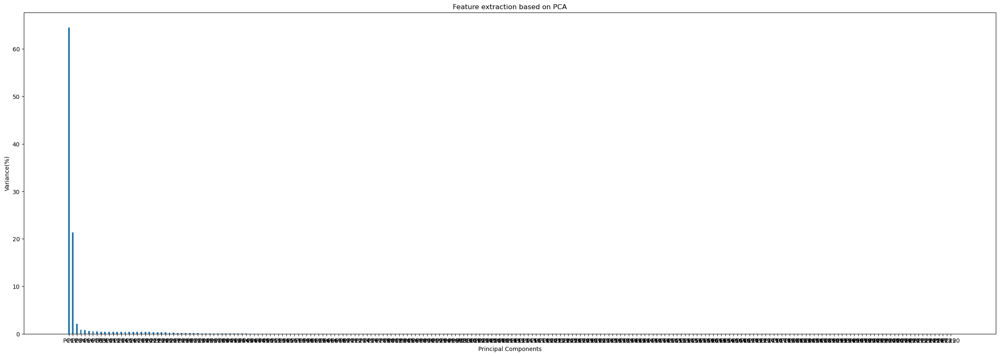

In [179]:
plt.figure(figsize=(30,10))
plt.bar(final_table.columns,final_table.loc['Variance(%)'],width = 0.4)
plt.xlabel('Principal Components')
plt.ylabel('Variance(%)')
plt.title('Feature extraction based on PCA')

Text(0.5, 1.0, 'Feature extraction based on PCA')

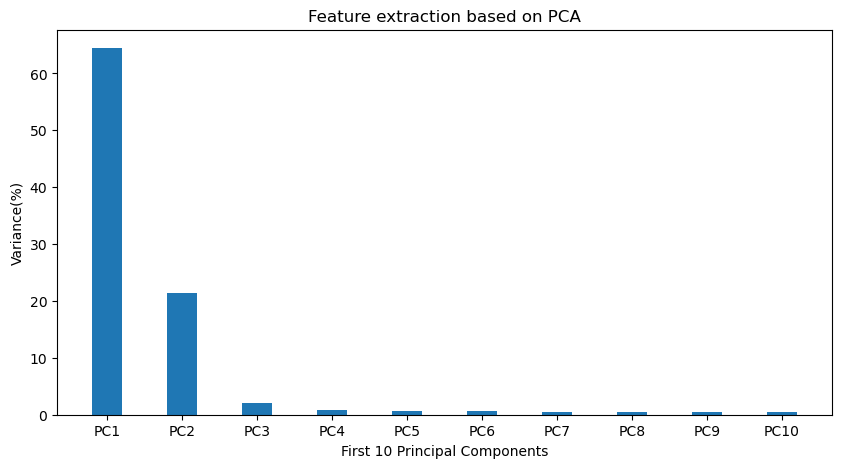

In [180]:
plt.figure(figsize=(10,5))
plt.bar(final_table.columns[:10],final_table.loc['Variance(%)'][:10],width = 0.4)
plt.xlabel('First 10 Principal Components')
plt.ylabel('Variance(%)')
plt.title('Feature extraction based on PCA')

Text(0.5, 1.0, 'Feature extraction based on PCA')

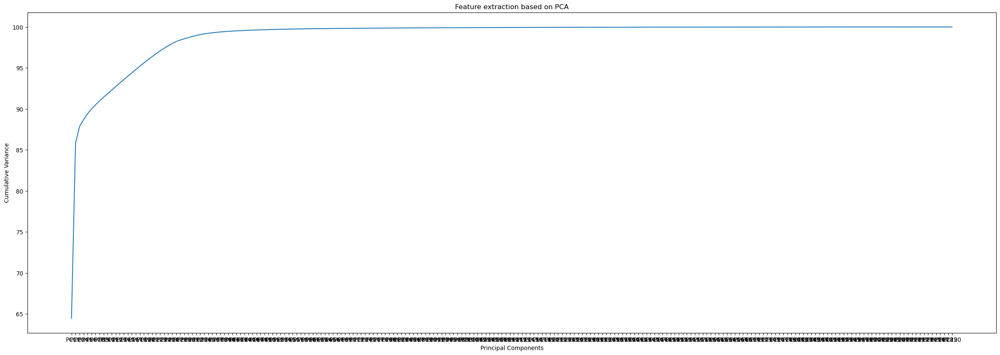

In [181]:
plt.figure(figsize=(30,10))
plt.plot(final_table.columns,final_table.loc['Cumulative Variance'])
plt.xlabel('Principal Components')
plt.ylabel('Cumulative Variance')
plt.title('Feature extraction based on PCA')

Text(0.5, 1.0, 'Feature extraction based on PCA')

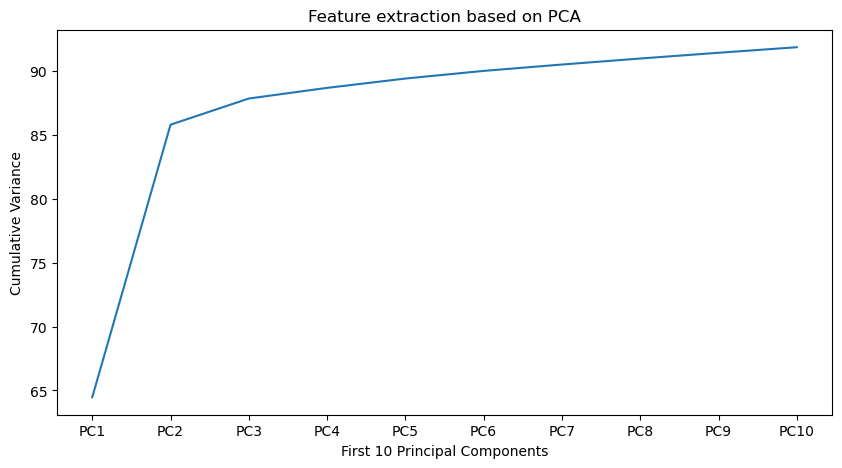

In [182]:
plt.figure(figsize=(10,5))
plt.plot(final_table.columns[:10],final_table.loc['Cumulative Variance'][:10])
plt.xlabel('First 10 Principal Components')
plt.ylabel('Cumulative Variance')
plt.title('Feature extraction based on PCA')

In [183]:
# selecting principal components that contain 95% varinace or information

l = list()

for i in final_table.columns:
    l.append(i)
    if final_table[i]['Cumulative Variance'] > 95 :
        break
print('The principal component(s) that cover more than 95% information are ',l)

The principal component(s) that cover more than 95% information are  ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17', 'PC18']


In [184]:
# extracted principal components

extracted_table = final_table[l]
extracted_table

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18
Variance,141.823678,46.944581,4.503318,1.835873,1.605336,1.319205,1.095736,1.035465,0.990900,0.954730,0.948734,0.940153,0.938126,0.934665,0.915400,0.905064,0.902083,0.871459
Variance(%),64.465308,21.338446,2.046963,0.834488,0.729698,0.599639,0.498062,0.470666,0.450409,0.433968,0.431243,0.427342,0.426421,0.424848,0.416091,0.411393,0.410038,0.396118
Cumulative Variance,64.465308,85.803754,87.850717,88.685205,89.414903,90.014541,90.512603,90.983269,91.433678,91.867646,92.298889,92.726231,93.152652,93.577500,93.993590,94.404983,94.815021,95.211139


In [185]:
# or we just can extract the number of principal components we want

l = list()
no_of_component = 2
count = 0

for i in final_table.columns:
    l.append(i)
    count = count + 1
    if count == no_of_component :
        break
print('The principal component(s) are ',l)

The principal component(s) are  ['PC1', 'PC2']


In [186]:
# extracted principal components

extracted_table = final_table[l]
extracted_table

,PC1,PC2
Variance,141.823678,46.944581
Variance(%),64.465308,21.338446
Cumulative Variance,64.465308,85.803754


Text(0, 0.5, 'PC2')

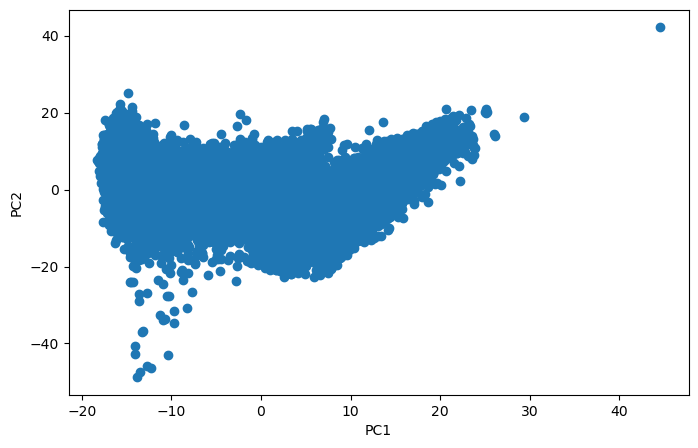

In [187]:
plt.figure(figsize=(8,5))
plt.scatter(transformed_table['PC1'],transformed_table['PC2'])
plt.xlabel('PC1')
plt.ylabel('PC2')

Text(0, 0.5, 'Second Principal Component')

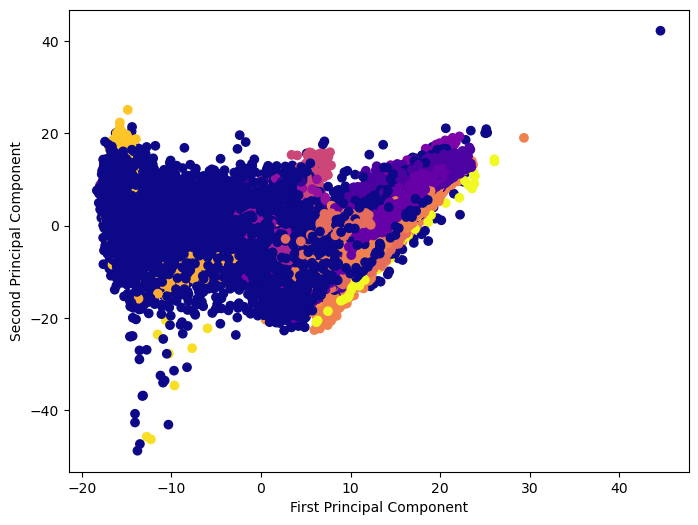

In [188]:
plt.figure(figsize=(8,6))
plt.scatter(transformed_table['PC1'],transformed_table['PC2'],c=target,cmap='plasma')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')

<AxesSubplot:xlabel='PC1', ylabel='PC2'>

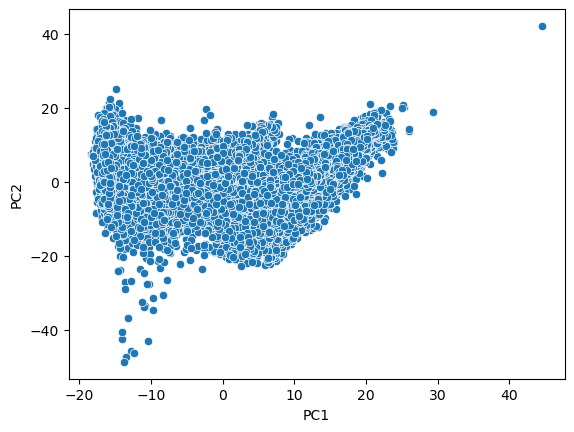

In [189]:
sns.scatterplot(x = transformed_table['PC1'],y = transformed_table['PC2'])

https://seaborn.pydata.org/generated/seaborn.scatterplot.html

In [190]:
transformed_table['PC1'].shape

(21025,)

In [191]:
target.shape

(21025,)

<AxesSubplot:xlabel='PC1', ylabel='PC2'>

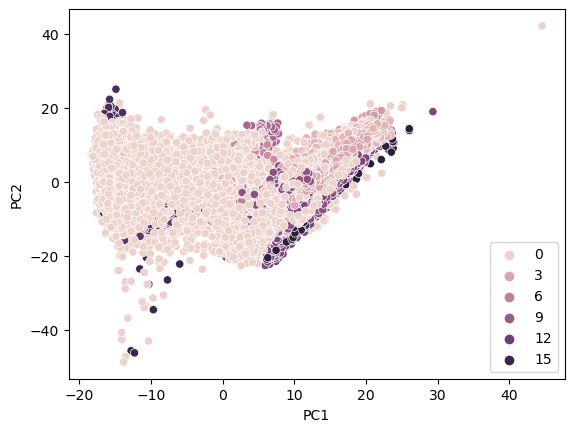

In [192]:
sns.scatterplot(x = transformed_table['PC1'], y = transformed_table['PC2'],hue=target)

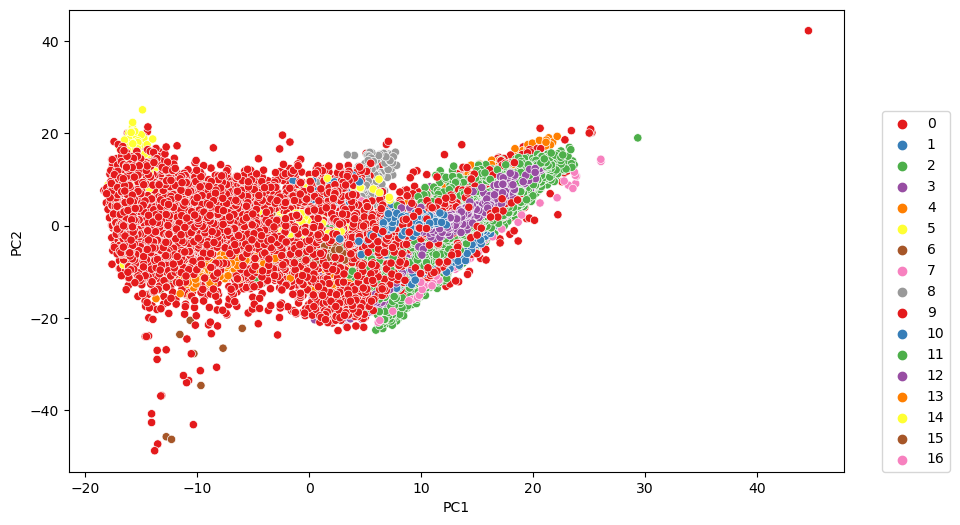

In [193]:
plt.figure(figsize=(10,6))
sns.scatterplot(x=transformed_table['PC1'],y=transformed_table['PC2'],hue=target,palette='Set1')
plt.legend(loc=(1.05,0))

## 3 Dimensional Plot of PCA with 3 Principal Components

In [194]:
# or we just can extract the number of principal components we want

l = list()
no_of_component = 3
count = 0

for i in final_table.columns:
    l.append(i)
    count = count + 1
    if count == no_of_component :
        break
print('The principal component(s) are ',l)

The principal component(s) are  ['PC1', 'PC2', 'PC3']


In [195]:
# extracted principal components

extracted_table = final_table[l]
extracted_table

,PC1,PC2,PC3
Variance,141.823678,46.944581,4.503318
Variance(%),64.465308,21.338446,2.046963
Cumulative Variance,64.465308,85.803754,87.850717


In [196]:
from mpl_toolkits import mplot3d

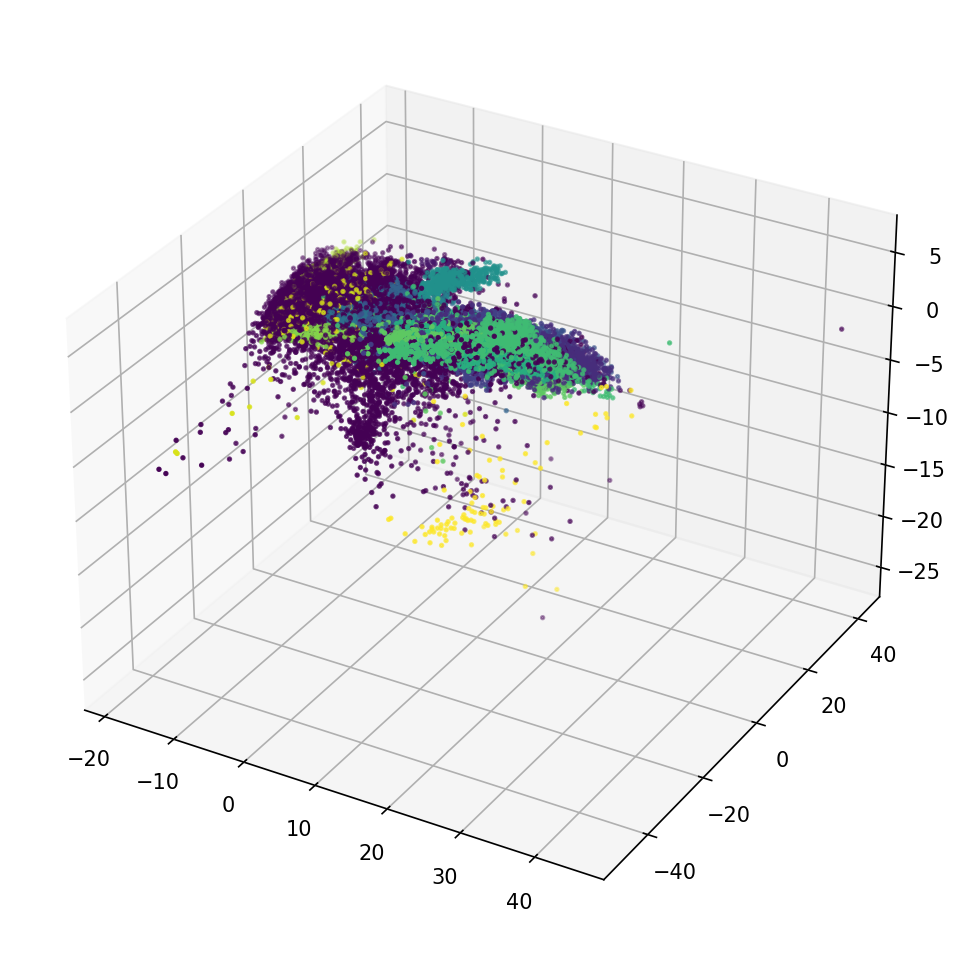

In [197]:
plt.figure(figsize=(8,8),dpi=150)
ax = plt.axes(projection='3d')
ax.scatter3D(transformed_table['PC1'],transformed_table['PC2'],transformed_table['PC3'],c=target,s=2.5);

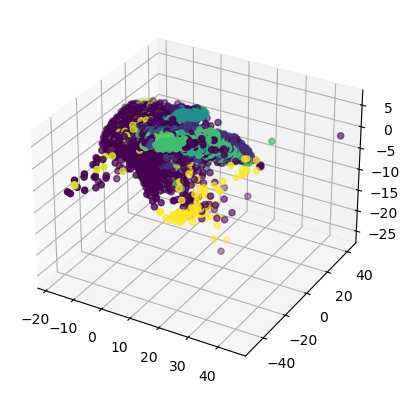

In [198]:
ax = plt.axes(projection='3d')
ax.scatter3D(transformed_table['PC1'],transformed_table['PC2'],transformed_table['PC3'],c=target)

## Image formation from first principal component

In [199]:
transformed_table['PC1']

0        10.324664
1        13.086477
2        14.296559
3        13.373526
4        11.614778
           ...    
21020   -15.684214
21021   -15.962773
21022   -15.513217
21023   -15.704617
21024   -15.763193
Name: PC1, Length: 21025, dtype: float64

In [200]:
transformed_table['PC1'].shape

(21025,)

In [201]:
np.array(transformed_table['PC1'])

array([ 10.32466407,  13.08647749,  14.29655887, ..., -15.51321683,
       -15.70461744, -15.7631925 ])

In [202]:
np.array(transformed_table['PC1']).reshape(145,145)

array([[ 10.32466407,  13.08647749,  14.29655887, ...,   7.71842425,
          6.68650689,   6.87326106],
       [  9.55053412,  12.25859521,  13.04188229, ...,  12.05147903,
         11.24033625,  10.66633904],
       [  8.95529747,  11.31036435,  12.8500164 , ...,  10.72150594,
          9.16956743,   7.52705817],
       ...,
       [-16.59532351, -17.00288805, -17.13425874, ..., -15.909446  ,
        -15.13166552, -15.25045679],
       [-16.80112542, -17.02897013, -17.22229409, ..., -16.09777021,
        -15.61935641, -15.02130665],
       [-17.24693932, -17.76193028, -18.07093883, ..., -15.51321683,
        -15.70461744, -15.7631925 ]])

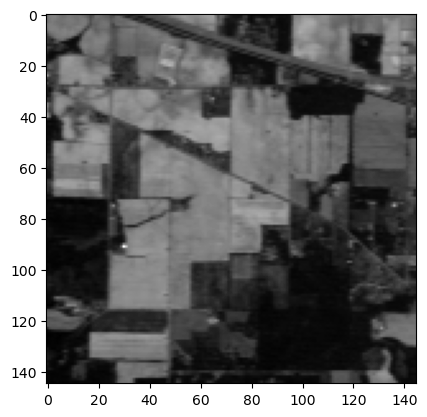

In [203]:
plt.imshow(np.array(transformed_table['PC1']).reshape(145,145),cmap='gray')
plt.show()

## Image formation from combination of 3 Principal Components

# KNN Implementation

## Making df

In [204]:
# or we just can extract the number of principal components we want

l = list()
no_of_component = 10
count = 0

for i in final_table.columns:
    l.append(i)
    count = count + 1
    if count == no_of_component :
        break
print('The principal component(s) are ',l)

The principal component(s) are  ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10']


In [205]:
# extracted principal components

extracted_table = final_table[l]
extracted_table

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
Variance,141.823678,46.944581,4.503318,1.835873,1.605336,1.319205,1.095736,1.035465,0.990900,0.954730
Variance(%),64.465308,21.338446,2.046963,0.834488,0.729698,0.599639,0.498062,0.470666,0.450409,0.433968
Cumulative Variance,64.465308,85.803754,87.850717,88.685205,89.414903,90.014541,90.512603,90.983269,91.433678,91.867646


In [206]:
extracted_table.columns

Index(['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'], dtype='object')

In [207]:
transformed_table[extracted_table.columns]

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,10.324664,-5.452025,0.060766,-1.624211,-2.259947,-0.385119,-0.439622,-1.711770,-0.052491,1.011703
1,13.086477,1.261508,-1.625356,-0.945794,-0.399669,0.955420,-0.679448,-2.709027,0.958040,-0.106255
2,14.296559,3.320279,-2.239404,-1.004822,-1.433226,1.149189,1.677195,-0.580127,-0.637801,0.481210
3,13.373526,1.919264,-2.174730,-1.717806,-3.440314,1.079273,-1.013792,0.461273,0.866040,-1.092014
4,11.614778,-2.597875,-0.244942,-1.395894,0.448789,1.445374,-0.315493,-0.933965,0.638229,0.838727
...,...,...,...,...,...,...,...,...,...,...
21020,-15.684214,5.085705,-1.007619,-1.179835,-0.776009,0.298507,-0.413208,0.266558,2.157486,-0.636759
21021,-15.962773,5.313408,-1.068225,-1.065580,0.023325,1.771958,-2.580210,0.305280,0.261367,-1.573539
21022,-15.513217,3.708422,-0.648144,-0.808948,-0.100656,0.032567,-1.019561,-1.066066,1.185445,0.525721
21023,-15.704617,-1.411807,-1.155832,-1.117314,-0.422809,0.518423,-2.525472,-0.536931,-1.092099,0.453247


In [208]:
df = transformed_table[extracted_table.columns]
df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,10.324664,-5.452025,0.060766,-1.624211,-2.259947,-0.385119,-0.439622,-1.711770,-0.052491,1.011703
1,13.086477,1.261508,-1.625356,-0.945794,-0.399669,0.955420,-0.679448,-2.709027,0.958040,-0.106255
2,14.296559,3.320279,-2.239404,-1.004822,-1.433226,1.149189,1.677195,-0.580127,-0.637801,0.481210
3,13.373526,1.919264,-2.174730,-1.717806,-3.440314,1.079273,-1.013792,0.461273,0.866040,-1.092014
4,11.614778,-2.597875,-0.244942,-1.395894,0.448789,1.445374,-0.315493,-0.933965,0.638229,0.838727
...,...,...,...,...,...,...,...,...,...,...
21020,-15.684214,5.085705,-1.007619,-1.179835,-0.776009,0.298507,-0.413208,0.266558,2.157486,-0.636759
21021,-15.962773,5.313408,-1.068225,-1.065580,0.023325,1.771958,-2.580210,0.305280,0.261367,-1.573539
21022,-15.513217,3.708422,-0.648144,-0.808948,-0.100656,0.032567,-1.019561,-1.066066,1.185445,0.525721
21023,-15.704617,-1.411807,-1.155832,-1.117314,-0.422809,0.518423,-2.525472,-0.536931,-1.092099,0.453247


In [209]:
target

array([3, 3, 3, ..., 0, 0, 0], dtype=int8)

In [210]:
df['target'] = target
df

C:\Users\HP\AppData\Local\Temp\ipykernel_15508\1132643761.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['target'] = target


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,target
0,10.324664,-5.452025,0.060766,-1.624211,-2.259947,-0.385119,-0.439622,-1.711770,-0.052491,1.011703,3
1,13.086477,1.261508,-1.625356,-0.945794,-0.399669,0.955420,-0.679448,-2.709027,0.958040,-0.106255,3
2,14.296559,3.320279,-2.239404,-1.004822,-1.433226,1.149189,1.677195,-0.580127,-0.637801,0.481210,3
3,13.373526,1.919264,-2.174730,-1.717806,-3.440314,1.079273,-1.013792,0.461273,0.866040,-1.092014,3
4,11.614778,-2.597875,-0.244942,-1.395894,0.448789,1.445374,-0.315493,-0.933965,0.638229,0.838727,3
...,...,...,...,...,...,...,...,...,...,...,...
21020,-15.684214,5.085705,-1.007619,-1.179835,-0.776009,0.298507,-0.413208,0.266558,2.157486,-0.636759,0
21021,-15.962773,5.313408,-1.068225,-1.065580,0.023325,1.771958,-2.580210,0.305280,0.261367,-1.573539,0
21022,-15.513217,3.708422,-0.648144,-0.808948,-0.100656,0.032567,-1.019561,-1.066066,1.185445,0.525721,0
21023,-15.704617,-1.411807,-1.155832,-1.117314,-0.422809,0.518423,-2.525472,-0.536931,-1.092099,0.453247,0


In [211]:
n = len(df.columns)
n

11

## Train Test Split

In [212]:
from sklearn.model_selection import train_test_split

In [213]:
X = df.drop(df.columns[n-1],axis=1)
X

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,10.324664,-5.452025,0.060766,-1.624211,-2.259947,-0.385119,-0.439622,-1.711770,-0.052491,1.011703
1,13.086477,1.261508,-1.625356,-0.945794,-0.399669,0.955420,-0.679448,-2.709027,0.958040,-0.106255
2,14.296559,3.320279,-2.239404,-1.004822,-1.433226,1.149189,1.677195,-0.580127,-0.637801,0.481210
3,13.373526,1.919264,-2.174730,-1.717806,-3.440314,1.079273,-1.013792,0.461273,0.866040,-1.092014
4,11.614778,-2.597875,-0.244942,-1.395894,0.448789,1.445374,-0.315493,-0.933965,0.638229,0.838727
...,...,...,...,...,...,...,...,...,...,...
21020,-15.684214,5.085705,-1.007619,-1.179835,-0.776009,0.298507,-0.413208,0.266558,2.157486,-0.636759
21021,-15.962773,5.313408,-1.068225,-1.065580,0.023325,1.771958,-2.580210,0.305280,0.261367,-1.573539
21022,-15.513217,3.708422,-0.648144,-0.808948,-0.100656,0.032567,-1.019561,-1.066066,1.185445,0.525721
21023,-15.704617,-1.411807,-1.155832,-1.117314,-0.422809,0.518423,-2.525472,-0.536931,-1.092099,0.453247


In [214]:
y = df[df.columns[n-1]]
y

0        3
1        3
2        3
3        3
4        3
        ..
21020    0
21021    0
21022    0
21023    0
21024    0
Name: target, Length: 21025, dtype: int8

In [215]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=42)

In [216]:
X_train

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
11564,4.172239,3.803624,2.114106,3.671862,0.883558,-1.091563,-2.493762,0.623599,-2.382449,1.088072
6824,18.902448,14.731452,-2.254405,-1.090766,-2.027153,0.198309,1.457079,-0.446621,-0.806511,1.981163
13573,-2.318474,0.658196,1.831751,1.391207,-2.173330,0.543361,1.094945,1.247411,1.394778,-0.340534
6494,6.863877,-5.643391,2.911557,1.108208,0.808187,0.366776,-0.615124,-1.659416,-2.478114,0.525931
15613,-16.079092,11.128752,-0.422914,-1.042299,2.348643,1.144204,-0.884837,-0.528844,0.003479,-0.450872
...,...,...,...,...,...,...,...,...,...,...
11284,-10.885838,-0.906703,0.315374,0.926645,0.409851,-1.488244,-0.040928,0.332403,-0.649106,0.669445
11964,13.546439,6.817555,-0.586208,0.814240,0.263219,-0.591535,-0.677448,-0.802325,0.372259,2.134928
5390,11.267796,2.511282,-2.646676,0.681001,-0.130871,0.169928,0.435790,-0.785806,1.037670,-0.037970
860,17.687839,5.253995,-0.328009,-0.113326,0.037049,0.628413,0.647507,-0.233004,1.382341,0.491694


In [217]:
X_test

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
18460,15.555146,4.059294,-0.977990,-1.434478,-1.321678,-1.754402,0.324941,-0.581751,0.422173,-2.403704
8260,2.800103,8.313660,2.867389,3.210807,-1.245467,-0.259108,-1.247213,1.966456,-0.074399,-1.062324
4741,-15.411531,-0.300555,-1.533962,-1.367614,0.502286,2.215127,1.596625,0.750085,-1.095180,2.064944
10117,-4.500613,-4.780010,-0.857479,1.915710,-0.950558,-1.696366,-1.514013,-1.279407,0.706875,-0.477339
10596,-16.331134,8.544487,-2.173716,-2.826494,0.798119,2.187825,-0.192377,0.313577,-0.705994,-1.206407
...,...,...,...,...,...,...,...,...,...,...
5248,17.779362,6.032960,-1.381400,-0.615699,-1.282774,0.918798,-0.664725,0.395449,-0.144546,0.176542
4455,-15.430075,0.940111,-0.344142,-0.831761,-0.950410,-0.130897,0.918575,0.258679,0.675103,2.566426
9418,-4.880768,5.808810,0.773673,3.456484,0.429309,-0.156342,-1.010569,0.262506,0.412804,1.415312
9185,17.909462,5.411932,-0.237456,-0.673782,0.244880,0.578395,-0.616629,-1.276697,-0.358481,-1.175980


## Finding the Best Value of K

In [218]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

In [219]:
import math
k = math.floor(math.sqrt(len(y_train)))

if k%2==0 :
    k = k + 1

print(k)

121


In [220]:
k_value = k

In [221]:
k_list = list()
accuracy_list = list()

for k in range(k_value):
    k = k + 1
    k_list.append(k)

    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train,y_train)

    y_pred = knn.predict(X_test)
    accuracy = accuracy_score(y_test,y_pred) * 100
    accuracy_list.append(accuracy)

Text(0, 0.5, 'Accuracy')

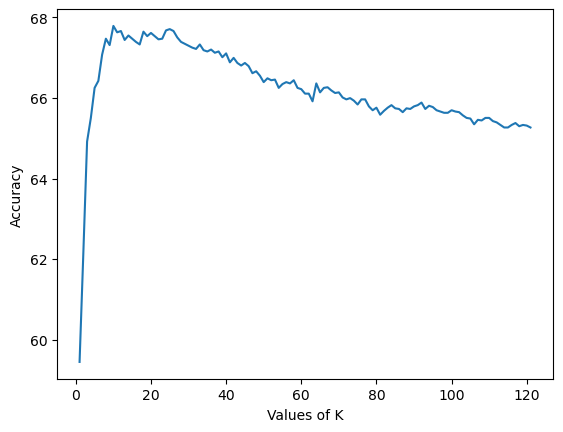

In [222]:
plt.plot(k_list,accuracy_list)
plt.xlabel('Values of K')
plt.ylabel('Accuracy')

In [223]:
max_accuracy = 0

for k in range(k_value):
    if accuracy_list[k] > max_accuracy:
        max_accuracy = accuracy_list[k]
        k_best = k_list[k]

print('Maximum Accuracy :',max_accuracy)
print('Best value of K :',k_best)

Maximum Accuracy : 67.78693722257451
Best value of K : 10


In [224]:
max_accuracy = max(accuracy_list)
print(max_accuracy)
max_index = accuracy_list.index(max(accuracy_list))
print(max_index)

k_best = k_list[max_index]
print(k_best)

67.78693722257451
9
10
